In [1]:
import pandas as pd
import numpy as np
import random
import scanpy as sc
import os
import warnings
warnings.filterwarnings("ignore")
import matplotlib as mpl
import matplotlib.pyplot as plt
import sys                      #通过下面这三行代码读取自己写的那些函数
sys.path.append('../')
import PROST
print(PROST.__version__)
from svg.plot import plot_3d_gene_expression
from svg.utils import simple_preprocess

 1.1.2 


In [2]:
# R的安装路径（用于mclust聚类），请根据“如何使用PROST”部分设置
ENVpath = r"C:\\Program Files\\R\\R-4.3.1"
os.environ['R_HOME'] = ENVpath
# 设置R的用户路径，确保rpy2包可以正常调用R
os.environ['R_USER'] = f'{ENVpath}/lib/python3.7/site-packages/rpy2'

# 设置随机种子，保证实验结果可复现
SEED = 818
PROST.setup_seed(SEED)

#%% 读取数据
section_num = 151672  # 指定要分析的组织切片编号

# 设置数据目录（如需使用其他数据，请修改文件路径）
rootdir = 'datasets/DLPFC'

# 构建输入、空间信息和输出结果的文件夹路径
input_dir = os.path.join(f'{rootdir}', str(section_num))           # 输入数据目录
spatial_dir = os.path.join(f'{rootdir}', str(section_num),  'spatial')  # 空间信息目录
output_dir = os.path.join(f'{rootdir}', str(section_num),   'results')  # 结果输出目录

# 如果输出目录不存在，则自动创建
if not os.path.isdir(output_dir):
    os.makedirs(output_dir)

**"Numerous computational methods exist, but varying SVG definitions and methodologies lead to incomparable results"**[1]

## Generation of Simulated Data

### cite



[1] presents three commonly used spatial patterns: 

- 1.**hotspot**:Genes exhibit significantly high expression in small local regions ("hotspot regions") of tissue sections, while the expression level is extremely low or absent outside these regions. Overall, they show an "aggregated" spatial distribution without a regular diffusion trend.

        example: Specific gene expression in the "tumor core area" within the tumor microenvironment (e.g., proliferation-related genes unique to cancer cells are highly expressed only in tumor foci), or the expression of neuron markers in specific functional regions of the brain (e.g., the CA1 region of the mouse hippocampus).

- 2.**ring** :Genes form closed circular regions of high expression in tissues, while the expression levels inside and outside these rings are significantly lower, presenting a symmetric or asymmetric spatial structure of "concentric circles" or "irregular rings".
  
        example:Gene expression at the "laminar structure boundaries" of tissue organs (e.g., in the villus-crypt structure of the intestinal epithelium, stem cell markers around the crypts show circular expression), or gene expression in the "inflammatory response ring" around cell apoptosis regions.
 
- 3.**strip**:Genes exhibit strip-like high expression along specific directions of tissues (e.g., horizontal, vertical, or oblique directions). There are obvious boundaries between the strips: the expression level is relatively uniform along the extension direction of the strips, while it decreases rapidly in the vertical direction, showing a "linear extension" spatial structure.
  
        example:Functional laminar" gene expression in tissues (e.g., in the layers of the cerebral cortex such as the molecular layer and external granular layer, layer-specific genes show a strip-like distribution), or the strip-like expression of "endothelial cell markers" around blood vessels along the direction of blood vessel alignment.



[5] discusses the following:
  
- **General Spatial Pattern**: Gene expression exhibits complex, non-periodic, and non-linear changes with spatial location. It has no fixed "repetitive period" or "linear trend" and is one of the most common spatial patterns.
  
        example:It often corresponds to the structural partitioning of tissues (e.g., different functional layers of organs, differences between the core and edge regions of tumor tissues). Examples include the Penk and Doc2g genes in the mouse olfactory bulb as mentioned in the document, and collagen-related genes (such as COL3A1 and COL1A2, Supp. Fig. 4C) in breast cancer tissues.

- **Periodic Spatial Pattern**: Gene expression shows "repetitive fluctuations" in space, with a fixed period length. Specifically, the expression peaks/valleys repeat regularly along spatial coordinates. For example, the Kcnh3 and Nrgn genes in the mouse olfactory bulb have a period of 1.8 mm, while the Slc17a7 gene has a period of 1.1 mm.

        It corresponds to regions with regularly repeated structures in tissues (e.g., the periodic distribution of neuron-dense areas, the rhythmic structure of cell arrangement), and may be associated with "regions with higher neuron density" (e.g., the foxj1 gene in SeqFISH data).


- **Linear Spatial Pattern**: Gene expression increases or decreases linearly with spatial coordinates (e.g., the x-axis or y-axis). In other words, the expression value is positively/negatively correlated with spatial location, and there is no periodicity.

        It corresponds to the expression distributed along a certain "gradient" in tissues (e.g., the gradient change of gene expression along the "anterior-posterior axis" during development, the expression difference along the density gradient in cell culture). For example, the htr3a gene in the SeqFISH data of the mouse hippocampus in the document.

### generation principle

1. Independent Expression Genes (indept1-10)

Genes expressed independently without spatial patterns, serving as negative controls.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$\mu_{ij} = \beta_j \cdot \eta_i$$
$$\eta_i \sim \text{Gamma}(\alpha=10, \beta=10)$$

**Symbol Explanation:**
- $Y_{ij}$: Expression count of gene $j$ in spot $i$
- $\beta_j$: Base expression level for gene $j$ ~ Uniform(0.5, 3.0)
- $\theta_j$: Dispersion parameter for gene $j$ ~ Uniform(6.0, 12.0)
- $\eta_i$: Spot-specific multiplicative noise with mean ≈ 1
---------------------------------------------------------------------------------
2. Co-expression Genes (correlated1-10)

Genes showing correlation through shared spot-level factors but no spatial patterning.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$\mu_{ij} = \beta_j \cdot G_i \cdot \epsilon_{ij}$$
$$G_i \sim \text{Gamma}(\alpha=2.5, \beta=2.5)$$
$$\epsilon_{ij} \sim \text{Gamma}(\alpha=60, \beta=60)$$

**Symbol Explanation:**
- $G_i$: Shared factor across genes in spot $i$
- $\epsilon_{ij}$: Gene-specific residual variation
- $\beta_j$: Gene-specific baseline ~ Uniform(0.8, 4.0)
--------------------------------------------------------------------------
3. Stripe Pattern Genes (stripe_1-5)

Linear patterns where expression decreases with distance from a central line.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
$$V_i = \max\left(0, 1 - \frac{D_i}{w_j}\right)$$
$$D_i = |x_i\sin\theta_j - y_i\cos\theta_j|$$

**Symbol Explanation:**
- $D_i$: Perpendicular distance from spot $i$ to line
- $\theta_j$: Line orientation angle ~ Uniform(0, π)
- $w_j$: Stripe width ~ Uniform(0.2R, 0.3R) where R is tissue radius
- $V_i$: Expression value based on distance (0-1 range)
--------------------------------------------------------------------------
4. Radial Pattern Genes (radial_1-5)

Point-source patterns with Gaussian decay from hotspot centers.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
$$V_i = \exp\left(-\frac{\|\mathbf{x}_i - \mathbf{c}_j\|^2}{2\sigma_j^2}\right)$$

**Symbol Explanation:**
- $\mathbf{c}_j$: Hotspot center coordinates (randomly selected spot)
- $\sigma_j$: Decay parameter ~ Uniform(0.15R, 0.3R)
- $\|\mathbf{x}_i - \mathbf{c}_j\|$: Euclidean distance to center
-----------------------------------------------------------------------
5. periodic stripe pattern Genes (periodic_stripe_1-5)

Triangular wave patterns creating striped periodic expressions.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
$$V_i = 1 - 2\left| \frac{P_i}{T_j} + \phi_j - 0.5 \right|$$
$$P_i = x_i\cos\theta_j + y_i\sin\theta_j$$

**Symbol Explanation:**
- $P_i$: Projection coordinate along direction $\theta_j$
- $T_j$: Period length ~ Uniform(0.48R, 0.8R)
- $\phi_j$: Phase shift ~ Uniform(0, 1)
- Triangular wave creates sharp transitions
------------------------------------------------------------------------
6. nonlinear superimposed pattern Genes (nonlinear_superimposed_1-5)

Sinusoidal patterns, potentially with interference for complex waveforms.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$V_i = 0.5\left[1 + \sin\left(2\pi\left(\frac{P_i}{T_j} + \phi_j\right)\right)\right]$$
$$\text{Optional: } V_i = 0.6V_i^{(1)} + 0.4V_i^{(2)}$$

**Symbol Explanation:**
- Sine wave creates smooth periodic patterns
- 50% chance of adding second wave component for interference
- Creates more complex standing wave patterns
-------------------------------------------------------------------------
7. Multi-peak Genes (multipk_1-5)

Multiple hotspot patterns combined through averaging.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$V_i = \frac{1}{k}\sum_{k=1}^{K} \exp\left(-\frac{\|\mathbf{x}_i - \mathbf{c}_{jk}\|^2}{2\sigma_{jk}^2}\right)$$

**Symbol Explanation:**
- $K$: Number of peaks (2 or 3 randomly)
- $\mathbf{c}_{jk}$: Center coordinates for peak $k$ of gene $j$
- Averaging creates complex expression landscapes
--------------------------------------------------------------------------
8. Ring Pattern Genes (ring_1-5)

Circular band patterns with expression maxima at specific distances.

**Mathematical Model:**
$$Y_{ij} \sim \text{NB}(\mu_{ij}, \theta_j)$$
$$V_i = \frac{1}{k}\sum_{k=1}^{K} \exp\left(-\frac{(D_{ik} - r_{jk})^2}{2w_{jk}^2}\right)$$
$$D_{ik} = \|\mathbf{x}_i - \mathbf{c}_{jk}\|$$

**Symbol Explanation:**
- $r_{jk}$: Ring radius ~ Uniform(0.25R, 0.85R)
- $w_{jk}$: Ring width ~ Uniform(0.06R, 0.12R)
- Gaussian function of distance from ideal radius
---------------------------------------------------------------------------
Negative Binomial Implementation

**Sampling Method (Poisson-Gamma mixture):**
$$\lambda_{ij} \sim \text{Gamma}\left(\alpha=\theta_j, \beta=\frac{\mu_{ij}}{\theta_j}\right)$$
$$Y_{ij} \sim \text{Poisson}(\lambda_{ij})$$

**Parameter Relationships:**
- Mean: $\mathbb{E}[Y] = \mu$
- Variance: $\text{Var}[Y] = \mu + \frac{\mu^2}{\theta}$
- Dispersion: Larger $\theta$ → closer to Poisson
-----------------------------------------------------------
Noise Model

**Multiplicative Noise:**
$$\eta_i \sim \text{Gamma}(25, 25)$$
- Maintains mean ≈ 1
- Adds biological variability
- Preserves distribution properties


8类基因表达数据的生成方法，均基于负二项分布（NB）模型，并通过不同的数学公式模拟特定的表达模式：

核心框架：负二项分布（NB）基础

所有基因的表达计数（$Y_{ij}$，即第$i$个点位、第$j$个基因的表达量）均通过负二项分布生成，这是单细胞/空间转录组数据中常用的分布模型，能很好地拟合表达数据中的过离散性（方差大于均值）。

负二项分布的实现采用**泊松-伽马混合模型**：
先从伽马分布中采样得到潜在均值$\lambda_{ij}$： 
$$\lambda_{ij} \sim \text{Gamma}\left(\alpha=\theta_j, \beta=\frac{\mu_{ij}}
{\theta_j}\right)$$ 
其中$\theta_j$是离散参数（越大越接近泊松分布），$\mu_{ij}$是模型的均值参数。
再从泊松分布中采样得到最终的表达计数： 
 
$$Y_{ij} \sim \text{Poisson}(\lambda_{ij})$$

**为什么要用Gamma-Poisson混合来生成服从负二项分布的数据？**

每个细胞/样本的"真实表达水平" $\lambda_{ij}$ 是不同的（生物学异质性）

$$\lambda_{ij} \sim \text{Gamma}$$
描述了这种细胞间的变异

$$Y_{ij} \mid \lambda_{ij} \sim \text{Poisson}$$
描述了测序过程的随机抽样

这样生成的负二项分布自然能够捕捉过度离散性（即方差大于均值的特征），这与单细胞/空间转录组数据的真实表达特征相符。

该模型的统计特性：  
- 均值：$\mathbb{E}[Y_{ij}] = \mu_{ij}$  
- 方差：$\text{Var}[Y_{ij}] = \mu_{ij} + \frac{\mu_{ij}^2}{\theta_j}$（方差随均值增大而增大，符合表达数据特征）


8类基因的表达模式生成逻辑:
每类基因的核心差异在于**均值参数$\mu_{ij}$的计算方式**，通过不同公式模拟特定的表达模式（如无空间模式、条纹状、辐射状等）。

---------------------------------------------------------------------
  1. 独立表达基因（Independent Expression Genes，indept1-10）
   
  **特征**：无空间模式，表达独立，作为阴性对照。

  **均值参数**$\mu_{ij}$：  

  $$\mu_{ij} = \beta_{j} \cdot \eta_{i}$$

  其中：  
  $\beta_j$：基因$j$的基础表达水平（服从均匀分布Uniform(0.5, 3.0)）。  

  $\eta_i$：点位$i$的 multiplicative noise（服从Gamma(10, 10)，均值≈1，仅添加随机噪声，无空间关联）。  

  无空间模式的核心：$\mu_{ij}$仅由基因自身基础水平和随机噪声决定，与点位的空间坐标无关。

-----------------------------------------------------------------
2. 共表达基因（Co-expression Genes，correlated1-10）
  
  **特征**：基因间通过共享点位因子关联，但无空间模式。

  **均值参数$\mu_{ij}$**：  

  $$ \mu_{ij} = \beta_j \cdot G_i  \cdot  \epsilon_{ij}$$
  
  其中：  
  $G_i$：所有基因共享的点位因子（服从Gamma(2.5, 2.5)，均值≈1，使同一点位的不同基因表达正相关）。  
  $\epsilon_{ij}$：基因$j$在点位$i$的特异性残差（服从Gamma(60, 60)，均值≈1，添加基因层面的随机噪声）。  
  共表达的核心：通过$G_i$实现基因间的相关性，但$G_i$与空间坐标无关，因此无空间模式。

-----------------------------------------------------------------------
3. 条纹模式基因（Stripe Pattern Genes，stripe_1-5）
   
  **特征**：线性条纹模式，表达量随与中心线的距离增加而降低。

  **均值参数$\mu_{ij}$**：  
  $$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
  其中$V_i$是决定条纹模式的核心变量：  
  $$V_i = \max\left(0, 1 - \frac{D_i}{w_j}\right)$$
  距离越近（$D_i$越小），$V_i$越接近1，表达量越高；超过条纹宽度$w_j$后 
  $V_i=0$。  
  $$D_i = |x_i\sin\theta_j - y_i\cos\theta_j|$$
  点位$i$到中心线的垂直距离（$\theta_j$是条纹的角度，决定方向）。  
  $w_j$：条纹宽度（服从Uniform(0.2R, 0.3R)，$R$为组织半径）。  

-------------------------------------------------------------------
4. 辐射模式基因（Radial Pattern Genes，radial_1-5）
   
  **特征**：点源模式，表达量从热点中心向外呈高斯衰减。

  **均值参数$\mu_{ij}$**：  
  $$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
  其中$V_i$是高斯衰减因子：  
  $$V_i = \exp\left(-\frac{\|\mathbf{x}_i - \mathbf{c}_j\|^2}{2\sigma_j^2}\right)$$
  $\mathbf{c}_j$：热点中心坐标（随机选择一个点位）。  
  $\|\mathbf{x}_i - \mathbf{c}_j\|$：点位$i$到中心的欧氏距离。  
  $\sigma_j$：衰减参数（越大，表达随距离下降越慢）。  

-------------------------------------------------------------------
5. 周期性条纹基因（periodic stripe pattern Genes，periodic_stripe_1-5）
   
**特征**：三角波模式，形成周期性条纹。

**均值参数$\mu_{ij}$**：  
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
其中$V_i$由三角波函数决定：  
$$V_i = 1 - 2\left| \frac{P_i}{T_j} + \phi_j - 0.5 \right|$$
$$P_i = x_i\cos\theta_j + y_i\sin\theta_j$$
点位$i$在$\theta_j$方向上的投影坐标（决定条纹方向）。  
$T_j$：周期长度（条纹间距），$\phi_j$：相位偏移（决定条纹起始位置）。 
 
----------------------------------------------------------------

6. 非线性叠加模式基因（nonlinear superimposed pattern Genes，nonlinear_superimposed_1-5）

**特征**：正弦波模式，可叠加多个波形成复杂干涉图案。

**均值参数$\mu_{ij}$**：  
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
其中$V_i$由正弦函数决定：  
$$V_i = 0.5\left[1 + \sin\left(2\pi\left(\frac{P_i}{T_j} + \phi_j\right)
\right)\right]$$
可选叠加：50%概率添加第二个正弦波（$V_i = 0.6V_i^{(1)} + 0.4V_i^{(2)}$），形成更复杂的驻波模式。  

---------------------------------------------------------------------
7. 多峰模式基因（Multi-peak Genes，multipk_1-5）
   
**特征**：多个热点的叠加，通过平均多个高斯峰形成复杂表达景观。

**均值参数$\mu_{ij}$**：  
  $$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
  其中$V_i$是多个高斯峰的平均值：  
  $$V_i = \frac{1}{k}\sum_{k=1}^{K} \exp\left(-\frac{\|\mathbf{x}_i - 
  \mathbf{c}_{jk}\|^2}{2\sigma_{jk}^2}\right)$$  
  $K$：峰的数量（随机为2或3个），$\mathbf{c}_{jk}$：第$k$个峰的中心坐标。  

-----------------------------------------------------------------------
8. 环状模式基因（Ring Pattern Genes，ring_1-5）
   
**特征**：环形带模式，在特定半径处表达量最高。

**均值参数$\mu_{ij}$**：  
  $$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$
  其中$V_i$是环形高斯函数：  
  $$V_i = \frac{1}{k}\sum_{k=1}^{K} \exp\left(-\frac{(D_{ik} - r_{jk})^2}{2w_{jk}^2}\right)$$
  $$D_{ik} = \|\mathbf{x}_i - \mathbf{c}_{jk}\|$$
  点位$i$到环中心$\mathbf{c}_{jk}$的距离。  
  $r_{jk}$：环的理想半径
  $w_{jk}$：环的宽度（控制环形带的粗细）。  

------------------------------------------------------------------

- 差异化的噪声设计:

使用gamma分布设计噪声是因为：表达量始终为正数，且gamma分布和负二项分布可通过Poisson-gamma混合模型构建联系。

不同基因类别使用差异化的噪声水平，以模拟不同的生物学场景：

| 基因类别 | 分布参数 | 变异系数 | 设计意图 |
|---------|---------|---------|---------|
| **空间模式基因**<br>(条纹、辐射、周期等) | $\eta_i \sim \text{Gamma}(25, 25)$ | CV ≈ 20.0% | 低噪声以突出空间模式信号 |
| **独立表达基因**<br>(indept1-10) | $\eta_i \sim \text{Gamma}(10, 10)$ | CV ≈ 31.6% | 中等噪声作为基准对照 |
| **共表达基因**<br>(correlated1-10) | $\eta_i \sim \text{Gamma}(2.5, 2.5)$ | CV ≈ 63.2% | 高噪声以增强基因间相关性 |

-数学表达:

所有噪声项均采用乘法噪声形式：
$$\mu_{ij} = (\beta_j + \alpha_j \cdot V_i) \cdot \eta_i$$

其中：
- $\eta_i$：点位特异性乘法噪声
- 期望值：$\mathbb{E}[\eta_i] = 1$（保持基础表达水平不变）
- 方差：$\text{Var}[\eta_i] = \alpha^{-1}$（控制噪声强度）

- 总结
这些方法通过**调整负二项分布的均值参数$\mu_{ij}$**，结合不同的空间函数（距离、角度、波函数等），生成了具有特定空间模式或无模式的基因表达数据，可用于验证空间转录组分析方法的有效性（如识别空间模式、区分共表达与空间关联等）。

### generate code

In [31]:
from svg_my_simulation.simulate_data_2 import simulate_data

simulate_data(n=2000, m=50)

import scanpy as sc

adata_simulate = sc.read_h5ad('simulated_visium_data.h5ad')
print(adata_simulate)

模拟数据已保存为 simulated_visium_data.h5ad（负二项计数版）
AnnData object with n_obs × n_vars = 2000 × 50
    obs: 'x', 'y'
    obsm: 'spatial'


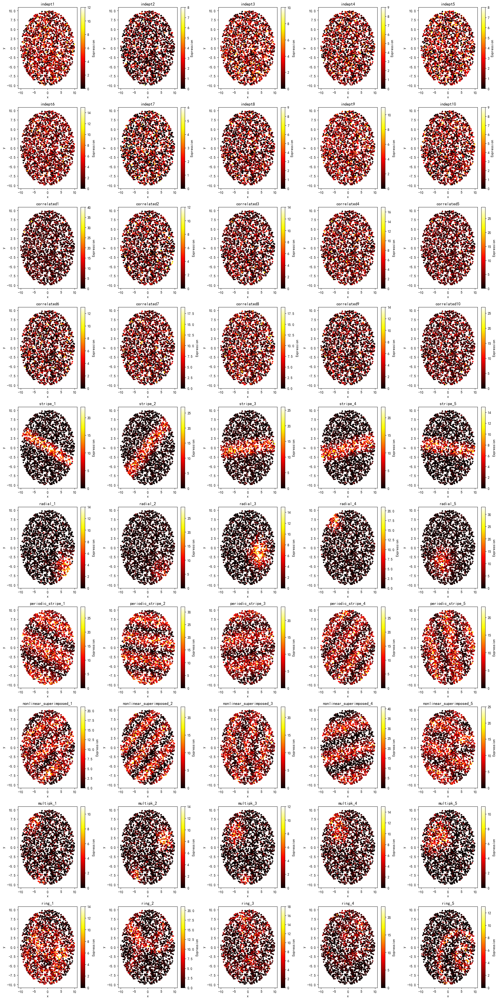

In [138]:
import matplotlib.pyplot as plt

gene_names = list(adata_simulate.var_names)
n_genes = len(gene_names)
ncols = 5
nrows = (n_genes + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()

for i, gene in enumerate(gene_names):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    ax = axes[i]
    sc = ax.scatter(adata_simulate.obsm['spatial'][:,0], adata_simulate.obsm['spatial'][:,1], c=expr, cmap='hot', s=10)
    ax.set_title(gene)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.colorbar(sc, ax=ax, label='Expression')

# 隐藏多余的子图
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

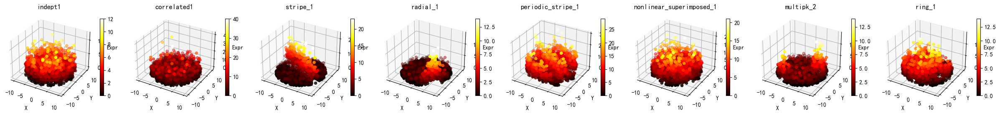

In [139]:
from svg.plot import plot_3d_gene_expression

gene_list = [
    "indept1", "correlated1", "stripe_1", "radial_1",
    "periodic_stripe_1", "nonlinear_superimposed_1", "multipk_2", "ring_1"
]

plot_3d_gene_expression(adata_simulate, gene_list, figsize=(24, 4))

## Moran's I and Geary's C

### Moran's I 

Steps:

1. Obtain the spatial coordinates of each spot.

2. Use the KNN (k-nearest neighbors) method to calculate the spatial neighbor relationship of each spot, and obtain the weight matrix $w$ (k=8).

3. Calculate the Moran's I value for each gene.


Moran's I = $$\frac{n}{\sum_{i=1}^{n}\sum_{j=1}^{n} w_{ij}} \cdot \frac{\sum_{i=1}^{n}\sum_{j=1}^{n} w_{ij}(x_i - \bar{x})(x_j - \bar{x})}{\sum_{i=1}^{n}(x_i - \bar{x})^2}$$

Where:
- $n$ is the number of sample spots.
  
- $w_{ij}$ is the weight between spot $i$ and spot $j$:    
  - If spot $i$ and spot $j$ are neighbors, $w_{ij} = 1$.
  
  - If spot $i$ and spot $j$ are not neighbors, $w_{ij} = 0$.
  
- $x_i$ is the gene expression value of spot $i$.
  
- $\bar{x}$ is the average of the gene expression values across all spots.

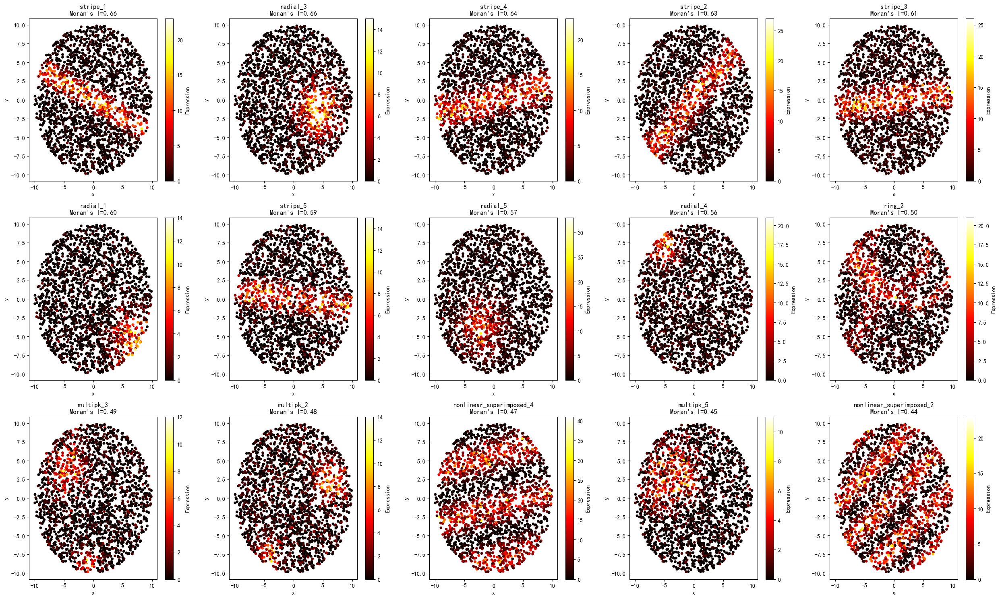

In [102]:
import matplotlib.pyplot as plt
from esda.moran import Moran
from libpysal.weights import KNN
import numpy as np

coords = adata_simulate.obsm['spatial']
w = KNN.from_array(coords, k=8)

gene_names = list(adata_simulate.var_names)
moran_results = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    mi = Moran(expr, w)
    moran_results.append((gene, mi.I, mi.p_norm))

top_genes = sorted(moran_results, key=lambda x: x[1], reverse=True)[:15]

fig, axes = plt.subplots(3, 5, figsize=(25, 15))
axes = axes.flatten()
for i, (gene, score, pval) in enumerate(top_genes):
    ax = axes[i]
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    sc = ax.scatter(coords[:,0], coords[:,1], c=expr, cmap='hot', s=15)
    ax.set_title(f"{gene}\nMoran's I={score:.2f}")
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.colorbar(sc, ax=ax, label='Expression')
# 隐藏多余子图（如果top_genes不足10）
for j in range(i+1, len(axes)):
    axes[j].axis('off')
plt.tight_layout()
plt.show()

### Geary's C 



 Steps:

1. Obtain the spatial coordinates of each spot.

2. Use the KNN (k-nearest neighbors) method to calculate the spatial neighbor relationship of each spot, and obtain the weight matrix $w$ (k=8).

3. Calculate the Geary's C value for each gene.

Geary's C Formula:

Geary's C = $$\frac{(n-1)}{2\sum_{i=1}^{n}\sum_{j=1}^{n} w_{ij}} \cdot \frac{\sum_{i=1}^{n}\sum_{j=1}^{n} w_{ij}(x_i - x_j)^2}{\sum_{i=1}^{n}(x_i - \bar{x})^2}$$

Where:
- $n$ is the number of sample spots.

- $w_{ij}$ is the weight between spot $i$ and spot $j$:
  - If spot $i$ and spot $j$ are neighbors, $w_{ij} = 1$.
  - If spot $i$ and spot $j$ are not neighbors, $w_{ij} = 0$.

- $x_i$ is the gene expression value of spot $i$.

- $x_j$ is the gene expression value of spot $j$.

- $\bar{x}$ is the average of the gene expression values across all spots.

Interpretation:
- Geary's C ranges from 0 to 2
- C < 1: Positive spatial autocorrelation (similar values cluster together)
- C = 1: No spatial autocorrelation (random distribution)
- C > 1: Negative spatial autocorrelation (dissimilar values cluster together)

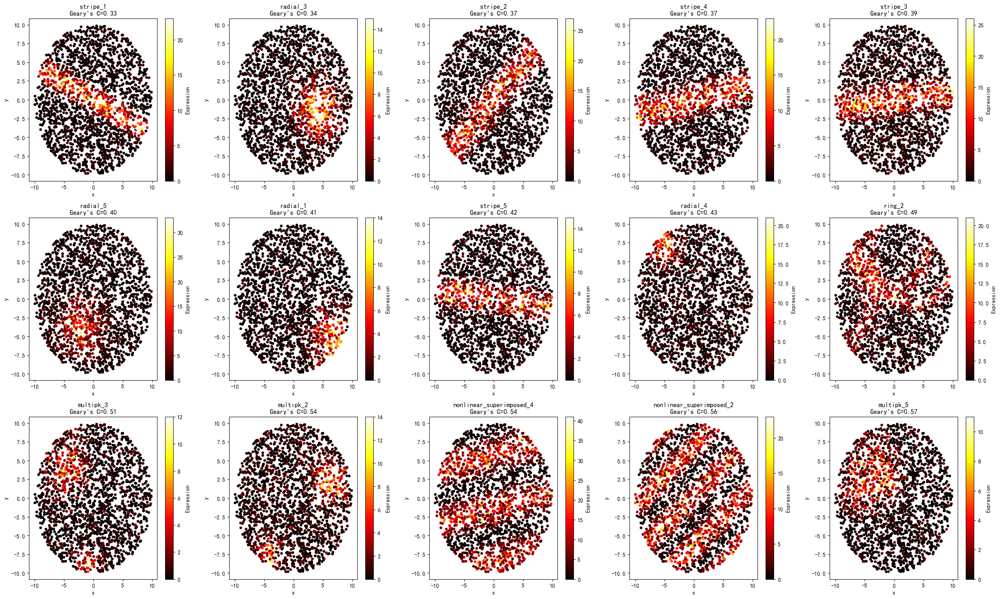

In [119]:
# 计算所有基因的Geary's C
from esda.geary import Geary

# ...existing code...
geary_results = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    gc = Geary(expr, w)
    geary_results.append((str(gene), gc.C))  # 强制转为字符串
# ...existing code...

# Geary's C前15名（值越小空间相关越强）
geary_top15_genes = sorted(geary_results, key=lambda x: x[1])[:15]

fig, axes = plt.subplots(3, 5, figsize=(25, 15))
axes = axes.flatten()
for i, (gene, score) in enumerate(geary_top15_genes):
    ax = axes[i]
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    sc = ax.scatter(coords[:,0], coords[:,1], c=expr, cmap='hot', s=15)
    ax.set_title(f"{gene}\nGeary's C={score:.2f}")
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.colorbar(sc, ax=ax, label='Expression')
# 隐藏多余子图（如果top_geary_genes不足15）
for j in range(i+1, len(axes)):
    axes[j].axis('off')
plt.tight_layout()
plt.show()

## Regression Methods and Non-parametric machine learning methods

### Ranked by $R^2$

The coefficient of determination ($R^2$) is a statistical measure that represents the proportion of the variance in the dependent variable that is predictable from the independent variables:

$$R^2 = 1 - \frac{SS_{\text{res}}}{SS_{\text{tot}}}$$

Where:
- $SS_{\text{res}} = \sum (y - \hat{y})^2$ is the sum of squared residuals.
- $SS_{\text{tot}} = \sum (y - \bar{y})^2$ is the total sum of squares.
- $\hat{y}$ is the vector of model's predicted values.
- $y$ is the vector of actual values.
- $\bar{y}$ is the mean of the actual values.

We rank genes based on their coefficient of determination ($R^2$) values calculated from the model, select the top 15 genes with the highest $R^2$, and then proceed with subsequent analyses.

In [80]:
# OLS回归R²排序
import statsmodels.api as sm
ols_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    X = sm.add_constant(coords)
    model = sm.OLS(expr, X).fit()
    ols_r2.append((gene, model.rsquared))
ols_top_genes = [g for g, _ in sorted(ols_r2, key=lambda x: x[1], reverse=True)[:15]]


In [81]:
# 多项式回归R²排序
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=2, include_bias=True)
coords_poly = poly.fit_transform(coords)
poly_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    model = sm.OLS(expr, coords_poly).fit()
    poly_r2.append((gene, model.rsquared))
poly_top_genes = [g for g, _ in sorted(poly_r2, key=lambda x: x[1], reverse=True)[:15]]

In [82]:
# 随机森林R²排序
from sklearn.ensemble import RandomForestRegressor
rf_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(coords, expr)
    score = model.score(coords, expr)
    rf_r2.append((gene, score))
rf_top_genes = [g for g, _ in sorted(rf_r2, key=lambda x: x[1], reverse=True)[:15]]

In [83]:
from pygam import LinearGAM, s

# GAM回归R²排序
gam_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        gam = LinearGAM(s(0) + s(1)).fit(coords, expr)
        score = gam.statistics_['pseudo_r2']['explained_deviance']
    except Exception:
        score = 0
    gam_r2.append((gene, score))
gam_top_genes = [g for g, _ in sorted(gam_r2, key=lambda x: x[1], reverse=True)[:15]]


In [84]:
from sklearn.svm import SVR

# SVM回归R²排序
svm_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = SVR(kernel='rbf')
        model.fit(coords, expr)
        score = model.score(coords, expr)
    except Exception:
        score = 0
    svm_r2.append((gene, score))
svm_top_genes = [g for g, _ in sorted(svm_r2, key=lambda x: x[1], reverse=True)[:15]]


In [85]:
from xgboost import XGBRegressor

# XGBoost回归R²排序
xgb_r2 = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
        model.fit(coords, expr)
        score = model.score(coords, expr)
    except Exception:
        score = 0
    xgb_r2.append((gene, score))
xgb_top_genes = [g for g, _ in sorted(xgb_r2, key=lambda x: x[1], reverse=True)[:15]]

In [86]:
from sklearn.neural_network import MLPRegressor
from tqdm import tqdm

# 多层感知机回归R²排序
mlp_r2 = []
for gene in tqdm(gene_names, desc="MLP回归", ncols=80):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
        model.fit(coords, expr)
        score = model.score(coords, expr)
    except Exception:
        score = 0
    mlp_r2.append((gene, score))
mlp_top_genes = [g for g, _ in sorted(mlp_r2, key=lambda x: x[1], reverse=True)[:15]]

MLP回归: 100%|██████████████████████████████████| 50/50 [00:50<00:00,  1.01s/it]


In [ ]:

from esda.geary import Geary
from tqdm import tqdm
from esda.moran import Moran
from libpysal.weights import KNN
import matplotlib.pyplot as plt

coords = adata_simulate.obsm['spatial']
w = KNN.from_array(coords, k=8)

def get_moran(gene):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    mi = Moran(expr, w)
    return mi.I

def get_geary(gene):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    gc = Geary(expr, w)
    return gc.C


ols_moran = [get_moran(g) for g in tqdm(ols_top_genes, desc="OLS前15 Moran", ncols=80)]
poly_moran = [get_moran(g) for g in tqdm(poly_top_genes, desc="多项式回归前15 Moran", ncols=80)]
rf_moran = [get_moran(g) for g in tqdm(rf_top_genes, desc="RF前15 Moran", ncols=80)]
gam_moran = [get_moran(g) for g in tqdm(gam_top_genes, desc="GAM前15 Moran", ncols=80)]
svm_moran = [get_moran(g) for g in tqdm(svm_top_genes, desc="SVM前15 Moran", ncols=80)]
xgb_moran = [get_moran(g) for g in tqdm(xgb_top_genes, desc="XGBoost前15 Moran", ncols=80)]
mlp_moran = [get_moran(g) for g in tqdm(mlp_top_genes, desc="MLP前15 Moran", ncols=80)]

ols_geary = [get_geary(g) for g in tqdm(ols_top_genes, desc="OLS前15 Geary", ncols=80)]
poly_geary = [get_geary(g) for g in tqdm(poly_top_genes, desc="多项式回归前15 Geary", ncols=80)]
rf_geary = [get_geary(g) for g in tqdm(rf_top_genes, desc="RF前15 Geary", ncols=80)]
gam_geary = [get_geary(g) for g in tqdm(gam_top_genes, desc="GAM前15 Geary", ncols=80)]
svm_geary = [get_geary(g) for g in tqdm(svm_top_genes, desc="SVM前15 Geary", ncols=80)]
xgb_geary = [get_geary(g) for g in tqdm(xgb_top_genes, desc="XGBoost前15 Geary", ncols=80)]
mlp_geary = [get_geary(g) for g in tqdm(mlp_top_genes, desc="MLP前15 Geary", ncols=80)]

# 已有 top_geary_genes 和 moran_top15_values，无需重复计算
geary_top15_values = [c for g, c in geary_results if g in top_geary_genes]
moran_top15_values = [mi for _, mi, _ in sorted(moran_results, key=lambda x: x[1], reverse=True)[:15]]


plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.boxplot([
    ols_moran, gam_moran, poly_moran, svm_moran, xgb_moran, rf_moran, mlp_moran,
    moran_top15_values  # 新增
], labels=['OLS前15', 'GAM前15', '多项式回归前15', 'SVM前15', 'XGBoost前15', 'RF前15', 'MLP前15', '莫兰指数前15'])
plt.ylabel("莫兰指数")
plt.title("回归方法和机器学习筛选基因的空间自相关比较")

plt.subplot(1, 2, 2)
plt.boxplot([
    ols_geary, gam_geary, poly_geary, svm_geary, xgb_geary, rf_geary, mlp_geary,
    geary_top15_values  # 新增
], labels=['OLS前15', 'GAM前15', '多项式回归前15', 'SVM前15', 'XGBoost前15', 'RF前15', 'MLP前15', "Geary's C前15"])
plt.ylabel("Geary's C")
plt.title("回归方法和机器学习筛选基因的Geary's C分布")
plt.tight_layout()
plt.show()

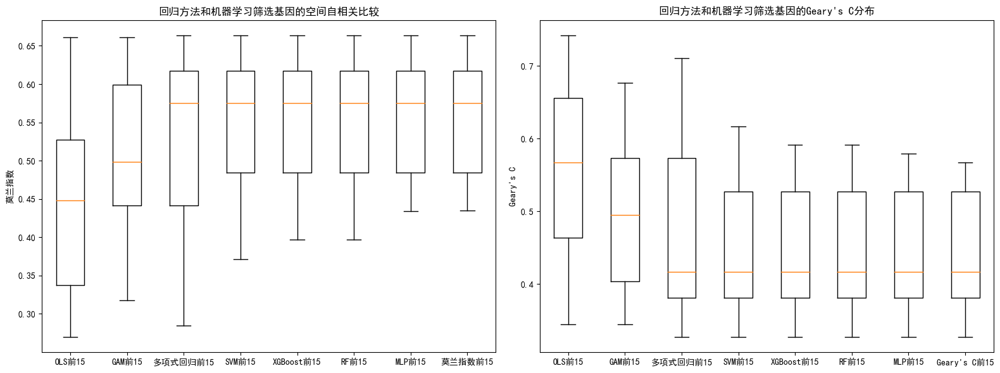

In [128]:
# 已有 top_geary_genes 和 moran_top15_values，无需重复计算

geary_top15_values = [c for _, c in sorted(geary_results, key=lambda x: x[1])[:15]]
moran_top15_values = [mi for _, mi, _ in sorted(moran_results, key=lambda x: x[1], reverse=True)[:15]]

plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.boxplot([
    ols_moran, gam_moran, poly_moran, svm_moran, xgb_moran, rf_moran, mlp_moran,
    moran_top15_values  # 新增
], labels=['OLS前15', 'GAM前15', '多项式回归前15', 'SVM前15', 'XGBoost前15', 'RF前15', 'MLP前15', '莫兰指数前15']),
plt.ylabel("莫兰指数")
plt.title("回归方法和机器学习筛选基因的空间自相关比较")

plt.subplot(1, 2, 2)
plt.boxplot([
    ols_geary, gam_geary, poly_geary, svm_geary, xgb_geary, rf_geary, mlp_geary,
    geary_top15_values  # 新增
], labels=['OLS前15', 'GAM前15', '多项式回归前15', 'SVM前15', 'XGBoost前15', 'RF前15', 'MLP前15', "Geary's C前15"])
plt.ylabel("Geary's C")
plt.title("回归方法和机器学习筛选基因的Geary's C分布")
plt.tight_layout()
plt.show()

### Ranked by SNR 

The Signal-to-Noise Ratio (SNR) is defined as the ratio of the variance of the model's predicted values (signal) to the variance of the residuals (noise):

$$SNR = \frac{Var(ŷ)}{Var(y - ŷ)}$$

Where:
- $ŷ$ is the vector of model's predicted values.
- $y$ is the vector of actual values.

We calculate the Signal-to-Noise Ratio (SNR) using the true values and fitted values of the model, select the 15 genes with the highest SNR, and then compute their Moran's I and Geary's C.

In [96]:
def get_snr(fit_vals, expr):
    residuals = expr - fit_vals
    signal_var = np.var(fit_vals)
    noise_var = np.var(residuals)
    return signal_var / (noise_var + 1e-8)

# OLS信噪比
ols_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    X = sm.add_constant(coords)
    model = sm.OLS(expr, X).fit()
    fit_vals = model.fittedvalues
    snr = get_snr(fit_vals, expr)
    ols_snr.append((gene, snr))
ols_snr_top_genes = [g for g, _ in sorted(ols_snr, key=lambda x: x[1], reverse=True)[:15]]
ols_snr_moran = [get_moran(g) for g in ols_snr_top_genes]

# 多项式回归信噪比
poly_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    model = sm.OLS(expr, coords_poly).fit()
    fit_vals = model.fittedvalues
    snr = get_snr(fit_vals, expr)
    poly_snr.append((gene, snr))
poly_snr_top_genes = [g for g, _ in sorted(poly_snr, key=lambda x: x[1], reverse=True)[:15]]
poly_snr_moran = [get_moran(g) for g in poly_snr_top_genes]

# 随机森林信噪比
rf_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(coords, expr)
    fit_vals = model.predict(coords)
    snr = get_snr(fit_vals, expr)
    rf_snr.append((gene, snr))
rf_snr_top_genes = [g for g, _ in sorted(rf_snr, key=lambda x: x[1], reverse=True)[:15]]
rf_snr_moran = [get_moran(g) for g in rf_snr_top_genes]

# GAM信噪比
gam_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        gam = LinearGAM(s(0) + s(1)).fit(coords, expr)
        fit_vals = gam.predict(coords)
        snr = get_snr(fit_vals, expr)
    except Exception:
        snr = 0
    gam_snr.append((gene, snr))
gam_snr_top_genes = [g for g, _ in sorted(gam_snr, key=lambda x: x[1], reverse=True)[:15]]
gam_snr_moran = [get_moran(g) for g in gam_snr_top_genes]

# SVM信噪比
svm_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = SVR(kernel='rbf')
        model.fit(coords, expr)
        fit_vals = model.predict(coords)
        snr = get_snr(fit_vals, expr)
    except Exception:
        snr = 0
    svm_snr.append((gene, snr))
svm_snr_top_genes = [g for g, _ in sorted(svm_snr, key=lambda x: x[1], reverse=True)[:15]]
svm_snr_moran = [get_moran(g) for g in svm_snr_top_genes]

# XGBoost信噪比
xgb_snr = []
for gene in gene_names:
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
        model.fit(coords, expr)
        fit_vals = model.predict(coords)
        snr = get_snr(fit_vals, expr)
    except Exception:
        snr = 0
    xgb_snr.append((gene, snr))
xgb_snr_top_genes = [g for g, _ in sorted(xgb_snr, key=lambda x: x[1], reverse=True)[:15]]
xgb_snr_moran = [get_moran(g) for g in xgb_snr_top_genes]

# MLP信噪比
mlp_snr = []
for gene in tqdm(gene_names, desc="MLP信噪比", ncols=80):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    try:
        model = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
        model.fit(coords, expr)
        fit_vals = model.predict(coords)
        snr = get_snr(fit_vals, expr)
    except Exception:
        snr = 0
    mlp_snr.append((gene, snr))
mlp_snr_top_genes = [g for g, _ in sorted(mlp_snr, key=lambda x: x[1], reverse=True)[:15]]
mlp_snr_moran = [get_moran(g) for g in mlp_snr_top_genes]


MLP信噪比: 100%|████████████████████████████████| 50/50 [00:51<00:00,  1.03s/it]


In [ ]:
from esda.geary import Geary
from tqdm import tqdm

def get_geary(gene):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    gc = Geary(expr, w)
    return gc.C

def get_moran(gene):
    expr = adata_simulate[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    mi = Moran(expr, w)
    return mi.I

# 莫兰指数和Geary's C，信噪比筛选前15基因
ols_snr_moran = [get_moran(g) for g in tqdm(ols_snr_top_genes, desc="OLS SNR前15 Moran", ncols=80)]
gam_snr_moran = [get_moran(g) for g in tqdm(gam_snr_top_genes, desc="GAM SNR前15 Moran", ncols=80)]
poly_snr_moran = [get_moran(g) for g in tqdm(poly_snr_top_genes, desc="多项式 SNR前15 Moran", ncols=80)]
svm_snr_moran = [get_moran(g) for g in tqdm(svm_snr_top_genes, desc="SVM SNR前15 Moran", ncols=80)]
xgb_snr_moran = [get_moran(g) for g in tqdm(xgb_snr_top_genes, desc="XGBoost SNR前15 Moran", ncols=80)]
rf_snr_moran = [get_moran(g) for g in tqdm(rf_snr_top_genes, desc="RF SNR前15 Moran", ncols=80)]
mlp_snr_moran = [get_moran(g) for g in tqdm(mlp_snr_top_genes, desc="MLP SNR前15 Moran", ncols=80)]

ols_snr_geary = [get_geary(g) for g in tqdm(ols_snr_top_genes, desc="OLS SNR前15 Geary", ncols=80)]
gam_snr_geary = [get_geary(g) for g in tqdm(gam_snr_top_genes, desc="GAM SNR前15 Geary", ncols=80)]
poly_snr_geary = [get_geary(g) for g in tqdm(poly_snr_top_genes, desc="多项式 SNR前15 Geary", ncols=80)]
svm_snr_geary = [get_geary(g) for g in tqdm(svm_snr_top_genes, desc="SVM SNR前15 Geary", ncols=80)]
xgb_snr_geary = [get_geary(g) for g in tqdm(xgb_snr_top_genes, desc="XGBoost SNR前15 Geary", ncols=80)]
rf_snr_geary = [get_geary(g) for g in tqdm(rf_snr_top_genes, desc="RF SNR前15 Geary", ncols=80)]
mlp_snr_geary = [get_geary(g) for g in tqdm(mlp_snr_top_genes, desc="MLP SNR前15 Geary", ncols=80)]



plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.boxplot([ols_snr_moran, gam_snr_moran, poly_snr_moran, svm_snr_moran, xgb_snr_moran, rf_snr_moran, mlp_snr_moran],
            labels=['OLS SNR前15', 'GAM SNR前15', '多项式 SNR前15', 'SVM SNR前15', 'XGBoost SNR前15', 'RF SNR前15', 'MLP SNR前15'])
plt.ylabel("莫兰指数")
plt.title("信噪比筛选基因的莫兰指数分布")

plt.subplot(1, 2, 2)
plt.boxplot([ols_snr_geary, gam_snr_geary, poly_snr_geary, svm_snr_geary, xgb_snr_geary, rf_snr_geary, mlp_snr_geary],
            labels=['OLS SNR前15', 'GAM SNR前15', '多项式 SNR前15', 'SVM SNR前15', 'XGBoost SNR前15', 'RF SNR前15', 'MLP SNR前15'])
plt.ylabel("Geary's C")
plt.title("信噪比筛选基因的Geary's C分布")
plt.tight_layout()
plt.show()

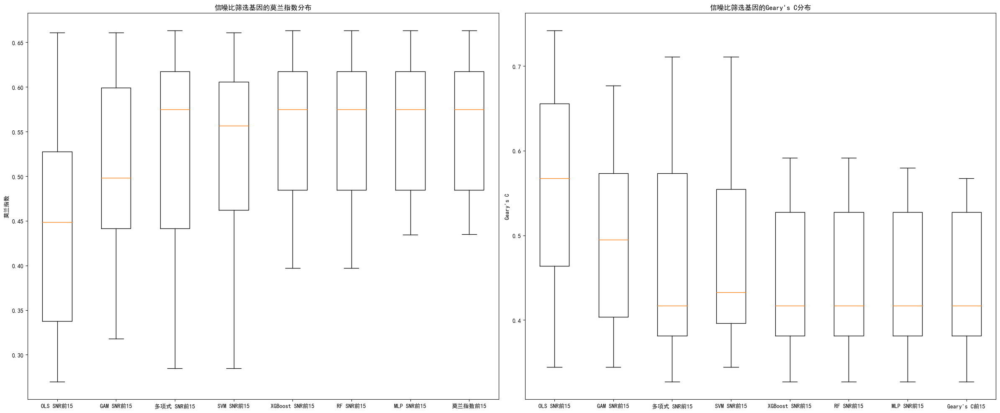

In [133]:
geary_top15_values = [c for _, c in sorted(geary_results, key=lambda x: x[1])[:15]]
moran_top15_values = [mi for _, mi, _ in sorted(moran_results, key=lambda x: x[1], reverse=True)[:15]]

plt.figure(figsize=(24, 10))
plt.subplot(1, 2, 1)
plt.boxplot([ols_snr_moran, gam_snr_moran, poly_snr_moran, svm_snr_moran, xgb_snr_moran, rf_snr_moran, mlp_snr_moran, moran_top15_values],
            labels=['OLS SNR前15', 'GAM SNR前15', '多项式 SNR前15', 'SVM SNR前15', 'XGBoost SNR前15', 'RF SNR前15', 'MLP SNR前15', '莫兰指数前15'])
plt.ylabel("莫兰指数")
plt.title("信噪比筛选基因的莫兰指数分布")

plt.subplot(1, 2, 2)
plt.boxplot([ols_snr_geary, gam_snr_geary, poly_snr_geary, svm_snr_geary, xgb_snr_geary, rf_snr_geary, mlp_snr_geary, geary_top15_values],
            labels=['OLS SNR前15', 'GAM SNR前15', '多项式 SNR前15', 'SVM SNR前15', 'XGBoost SNR前15', 'RF SNR前15', 'MLP SNR前15', 'Geary\'s C前15'])
plt.ylabel("Geary's C")
plt.title("信噪比筛选基因的Geary's C分布")
plt.tight_layout()
plt.show()

## Euclidean-space-based methods

### Kernel-based methods

Methods based on kernel functions use pre-defined kernel functions to capture spatial patterns through spot coordinates. Common kernel functions include:

- Gaussian kernel (used for detecting aggregated or focal expression patterns)：
 $$K(s_i, s_j) = \exp\left(-\frac{\|s_i - s_j\|^2}{2\sigma^2}\right)$$

- cosine kernel (used for detecting periodic expression patterns)：
 $$K(s_i, s_j) = \cos\left(2\pi\frac{\|s_i - s_j\|}{\phi}\right)$$

For a given gene, the covariance matrix of its expression vector $Y$ (may
be subject to transformation) can be decomposed into components,
one of which depends on $ K(s) $. If the contribution of this term is significantly positive according to a hypothesis test, commonly known as
the “variance component test,” the gene is detected as an overall SVG

#### SpatialDE and its derivative methods

- $ \mathit{SpatialDE[4]} $ assumes that a gene's normalized expression $ \mathbf{Y}\in\mathbb{R}^{n} $ follows an n-dimensional Gaussian distribution, with a covariance matrix that includes a spatial covariance component involving $ \mathbf{K}(\mathbf{s}) $:

$$ \mathbf{Y}\sim\operatorname{MVN}(\boldsymbol{\mu},\sigma_{s}^{2}\cdot\mathbf{K}(\mathbf{s})+\delta\cdot\mathbf{I}), $$

where MVN represents a multivariate Gaussian distribution with a mean vector $ \boldsymbol{\mu}\in\mathbb{R}^{n} $ and a covariance matrix $ \sigma_{s}^{2}\cdot\mathbf{K}(\mathbf{s})+\delta\cdot\mathbf{I} $. Here, I is an n-dimensional identity matrix, and $ \sigma_{s}^{2} $ and $ \delta $ are parameters representing the spatial covariance component and the error variance component, respectively. This model is a realization of a Gaussian process with the kernel function $ K(\cdot,\cdot) $. 

To determine if a gene is an overall SVG, SpatialDE employs a likelihood ratio test with the null hypothesis $ H_{0}:\sigma_{s}^{2}=0 $, comparing this model with a null model that does not include the spatial covariance component: $ \mathbf{Y}\sim\operatorname{MVN}(\boldsymbol{\mu},\sigma^{2}\cdot\mathbf{I}) $.

(Note: The null hypothesis means "the spatial covariance component contributes nothing, and gene expression is independent of spatial location"). During the testing process, the model containing the spatial covariance component is compared with a null model that does not contain this component (expressed as $ \mathbf{Y} \sim \operatorname{MVN}(\boldsymbol{\mu}, \sigma^{2} \cdot \mathbf{I}) $). If the null hypothesis is rejected, the gene is considered an overall SVG.

- $\mathit{nnSVG[7]}$ adopts the same model framework as SpatialDE, but improves computational efficiency by replacing the Gaussian process with the nearest-neighbor Gaussian process.

- $\mathit{SOMDE[6]}$ also follows the statistical model of SpatialDE but adds a data preprocessing step for scalability. Specifically, SOMDE condenses the original spatial spots into fewer grid points and assigns each grid point a “meta-expression,” which aggregates a gene’s expression levels at the spots condensed into that grid point. After this preprocessing step, SOMDE uses the same approach as SpatialDE to detect whether the gene is an overall SVG, but it does so using the grid points instead of the original spots.

- Compared to the first three methods, $\mathit{SVCA [8]}$ modifies the covariance matrix decomposition by adding two additional components: 

$$Y \sim MVN\left(\mu, K_{int}+K_{c-c}+\sigma_{s}^{2} \cdot K(s)+\sigma^{2} \cdot I\right),$$

where $K_{int}$ denotes the intrinsic cell-state covariance, and $K_{c-c}$ represents the cell-cell interaction covariance. Specifically, $K_{int}$ is defined solely using gene expression data without spatial information, while $K_{c-c}$ incorporates both gene expression data and Euclidean distances among spots.


#### Spark and its derivative methods

Instead of using normalized gene expression data, $\mathit{SPARK}[9]$, $\mathit{GPcounts[32]}$, and $\mathit{BOOST-GP}$ directly model a gene’s expression count at spot $i$ ,$Y_{i} \in \mathbb{N}$, using Poisson, negative binomial (NB), and zero-inflated negative binomial (ZINB) distributions, respectively. For instance, $\mathit{SPARK}[9]$ assumes that:

$$Y_{i} \stackrel{ind}{\sim} Poisson \left(\mu_{i}\left(s_{i}\right)\right), i=1,2, \cdots, n.$$

In [42]:
import SpatialDE

# coords: n x 2 的空间坐标
coords_df = pd.DataFrame(adata_simulate.obsm['spatial'], columns=['x', 'y'])
# 表达矩阵：行是spot，列是基因
expr_df = pd.DataFrame(adata_simulate.X, columns=adata_simulate.var_names)

# SpatialDE 检测空间变异基因
results = SpatialDE.run(coords_df, expr_df)

# 查看全部基因的空间变异得分（前十名和后十名，不筛选qval）
all_genes = results.sort_values('LLR', ascending=False)
print("前十名空间变异基因：")
print(all_genes[['g', 'qval', 'LLR']].head(10))
print("\n后十名空间变异基因：")
print(all_genes[['g', 'qval', 'LLR']].tail(10))

Models: 100%|██████████| 10/10 [00:01<00:00,  6.53it/s]


前十名空间变异基因：
            g  qval          LLR
20   stripe_1   0.0  1029.143628
25   radial_3   0.0   986.745450
21   stripe_2   0.0   944.458106
23   stripe_4   0.0   930.453851
48   radial_1   0.0   871.526967
22   stripe_3   0.0   866.162785
27   radial_5   0.0   834.035010
24   stripe_5   0.0   766.218002
26   radial_4   0.0   726.655873
40  multipk_3   0.0   590.799755

后十名空间变异基因：
               g      qval       LLR
7        indept8  0.848205  0.153166
8        indept1  0.852839  0.131983
2        indept7  0.870318  0.102818
16  correlated10  0.898367  0.070532
1        indept5  0.994096  0.000524
5    correlated6  0.994096  0.000188
4    correlated3  0.994096  0.000157
17   correlated9  0.994096  0.000093
0        indept4  0.994096  0.000079
18   correlated7  0.994096  0.000055


## reference

Primary References：

- [1] Yan, Guanao et al. "Categorization of 34 Computational Methods to Detect Spatially Variable Genes from Spatially Resolved Transcriptomics Data",Nature communications 16.1 (2025): 1-21.

- [2] Liang, Yuchen et al. "PROST: Quantitative Identification of Spatially Variable Genes and Domain Detection in Spatial Transcriptomics",    Nature communications 15.1 (2024)

- [3] Adhikari, Sikta Das et al. "SPACE: Spatially Variable Gene Clustering Adjusting for Cell Type Effect for Improved Spatial Domain Detection.",Nucleic Acids Research 53.18 (2025)

- [4] Svensson, Valentine et al. "SpatialDE: Identification of Spatially Variable Genes",Nature methods 15.5 (2018): 343-346.

- [5] Hu, Jian et al. "SpaGCN: Integrating Gene Expression, Spatial Location and Histology to Identify Spatial Domains and Spatially Variable Genes by Graph Convolutional Network",Nature methods 18.11 (2021): 1342-1351.

- [6] Hao, Minsheng et al. "SOMDE: a Scalable Method for Identifying Spatially Variable Genes with Self-Organizing Map.",Bioinformatics 37.23 (2021): 4392-4398.

- [7] Weber, L. M., Saha, A., Datta, A., Hansen, K. D. & Hicks, S. C. nnSVG for the scalable identification of spatially variable genes using nearest-
neighbor gaussian processes. Nature communications. 14, 4059 (2023).

- [8] Arnol, Damien et al. "Modeling Cell-Cell Interactions from Spatial Molecular Data with Spatial Variance Component Analysis",Cellular reprogramming 29.1 (2019): 202-211.e6.

- [9] Sun, Shiquan et al. "Statistical Analysis of Spatial Expression Patterns for Spatially Resolved Transcriptomic Studies",Nature methods 17.1 (2019): 193-200.

## notation

| Symbol | Interpretation |
|--------|----------------|
| $ n \in \mathbb{Z}^{+} $ | Number of spatial spots |
| $ y_{i} \in \mathbb{R} $ | Expression level of a gene at spot i |
| $ Y_{i} \in \mathbb{R} $ | Random variable representing the expression level of a gene at spot i |
| $ Y = (Y_{1}, \ldots, Y_{n})^{\top} \in \mathbb{R}^{n} $ | Random vector of a gene's expression levels at all n spatial spots |
| $ \mathbf{s}_{i} = (s_{i1}, s_{i2})^{\top} \in \mathbb{R}^{2} $ | 2D spatial location of spot i |
| $ \mathbf{s} = [\mathbf{s}_{1}, \ldots, \mathbf{s}_{n}]^{\top} \in \mathbb{R}^{n \times 2} $ | Matrix of spatial coordinates for all n spots |
| $ \mathbf{d}_{i} = (d_{i1}, \ldots, d_{iL})^{\top} \in \{0,1\}^{L} $ | Spatial-domain indicator vector for spot i |
| $ \mathbf{c}_{i} = (c_{i1}, \ldots, c_{iK})^{\top} \in [0,1]^{K} $ | Cell-type proportion vector for spot i |
| $ \mathbf{x}_{i} \in \mathbb{R}^{p} $ | Fixed-effect covariates of spot i |
| $ \mathbf{z}_{i} \in \mathbb{R}^{q} $ | Random-effect covariates of spot i |
| $ \epsilon_{i} \in \mathbb{R} $ | Random measurement error at spot i |
| $ \boldsymbol{\epsilon} = (\epsilon_{1}, \ldots, \epsilon_{n})^{\top} \in \mathbb{R}^{n} $ | Vector of random measurement errors with assumed independence |
| $ \beta_{0} \in \mathbb{R} $ | (Fixed) intercept in the linear mixed model |
| $ \boldsymbol{\beta} \in \mathbb{R}^{p} $ | Fixed effects in the linear mixed model |
| $ \boldsymbol{\gamma} \in \mathbb{R}^{q} $ | Random effects in the linear mixed model |
| $ \boldsymbol{\Sigma} \in \mathbb{R}^{q \times q} $ | Covariance matrix of random effects $ \boldsymbol{\gamma} $ |